<a href="https://colab.research.google.com/github/mdsalem17/scientific-guide-notebooks/blob/main/MNIST_GANs/MNIST_Vanilla_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vanilla GAN

### Goal
In this notebook, we're going to create a vanilla generative adversarial network (GAN), we will build and train a GAN that can generate hand-written images of digits (0-9).

## Getting Started
We will begin by importing some useful packages and the dataset we will use to build and train our GAN.

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Generator
The first step is to build the generator component.

We will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function.

In [ ]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now we can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST).

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is our default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "No block in our solution"
    assert test_output.std() > 0.05, "No batchnorm here"
    assert test_output.std() < 0.15, "No batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use the generator, we will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- we can think of it as a random seed. We will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, we will generate all the noise vectors at once.

In [ ]:
def get_noise(n_samples, z_dim, device='cuda'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    
    return torch.randn(n_samples,z_dim,device=device)

In [ ]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cuda'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that we need to construct is the discriminator. As with the generator component, we will start by creating a function that builds a neural network block for the discriminator.

*Note: We use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient.*

In [ ]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

In [ ]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now we can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real.

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is our default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now we can put it all together!
First, we will set our parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times we iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, we will load the MNIST dataset as tensors using a dataloader.



In [ ]:
# Setting the parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Now, we can initialize our generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before training our GAN, we will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, wwe will need to call .detach() on the generator result to ensure that only the discriminator is updated!

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps we will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2

    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps we will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, we can put everything together! For each epoch, we will process the entire dataset in batches. For every batch, we will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image).

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN.

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1, step 500: Generator loss: 1.3947584968805307, discriminator loss: 0.4180249745845796


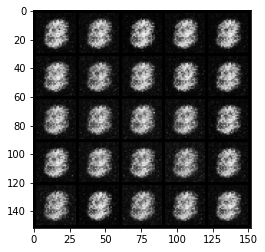

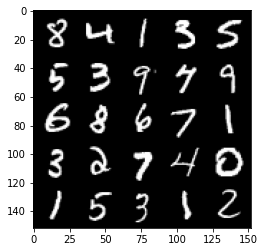

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: 1.7517012143135056, discriminator loss: 0.2798498759865762


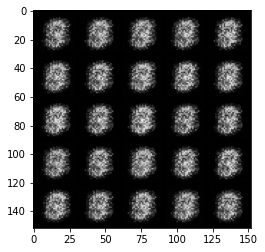

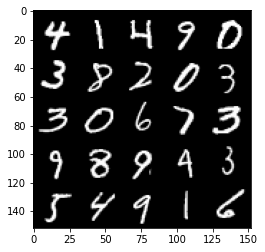

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3, step 1500: Generator loss: 2.0688039951324444, discriminator loss: 0.1577954088896512


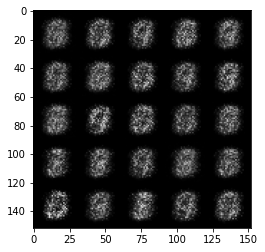

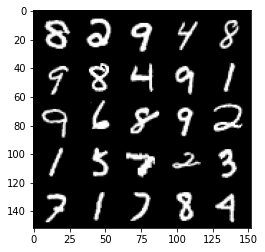

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 1.6759789636135098, discriminator loss: 0.22538386201858523


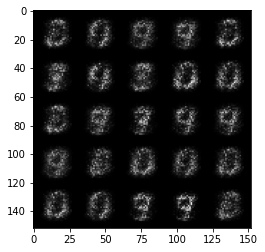

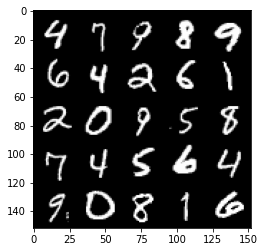

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5, step 2500: Generator loss: 1.6749283435344697, discriminator loss: 0.2054973072111607


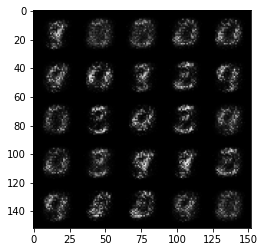

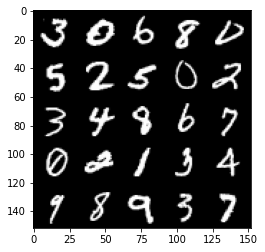

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 1.8768143820762622, discriminator loss: 0.17904906395077702


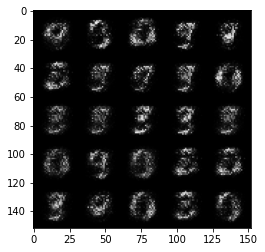

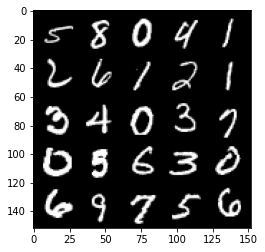

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7, step 3500: Generator loss: 2.2993352942466734, discriminator loss: 0.1411742519587279


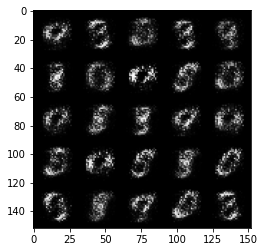

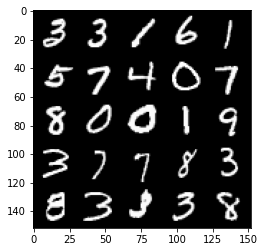

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 2.6702940707206726, discriminator loss: 0.11327880769968034


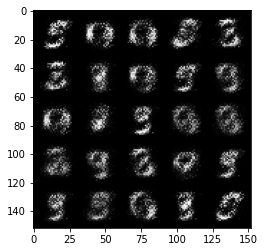

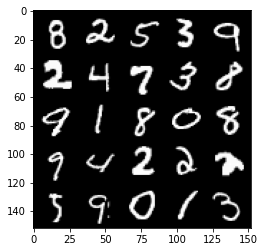

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9, step 4500: Generator loss: 3.121730731964111, discriminator loss: 0.08577697853744028


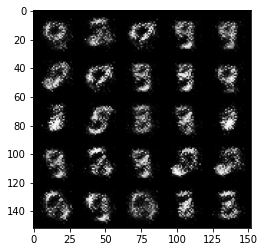

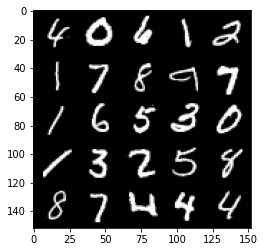

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 3.6015801658630355, discriminator loss: 0.06457566250115629


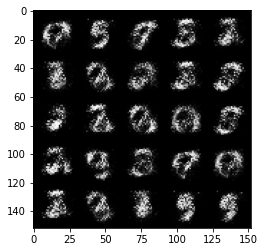

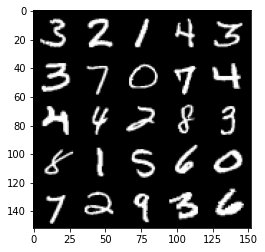

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11, step 5500: Generator loss: 3.7122260298728955, discriminator loss: 0.05668596442788837


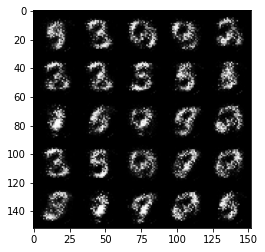

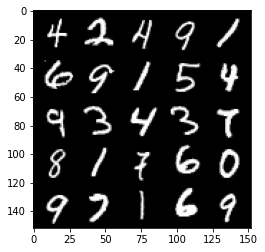

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 4.118671463489532, discriminator loss: 0.05063780668377876


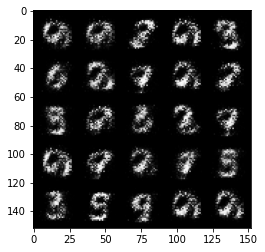

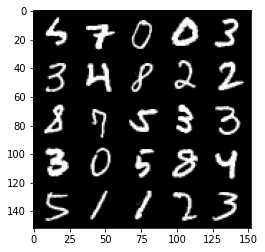

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13, step 6500: Generator loss: 4.029770560741426, discriminator loss: 0.051805783193558434


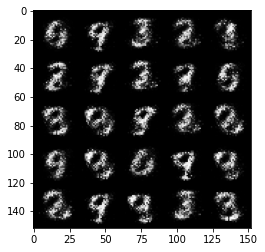

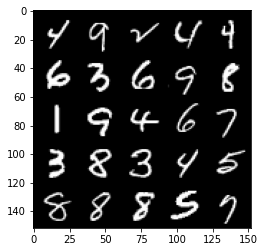

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 4.220003564834591, discriminator loss: 0.04300509383156897


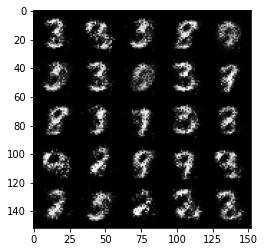

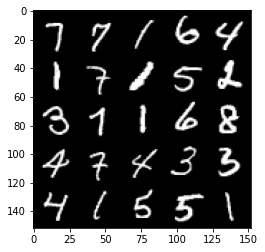

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15, step 7500: Generator loss: 4.360877798557278, discriminator loss: 0.044336684174835654


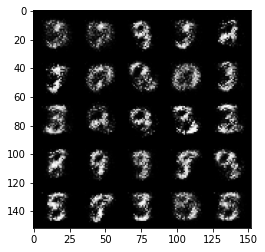

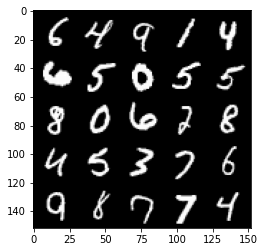

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 4.343655608654024, discriminator loss: 0.056260760225355595


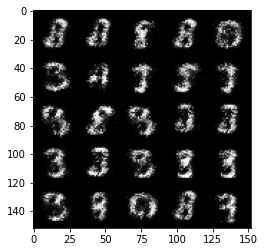

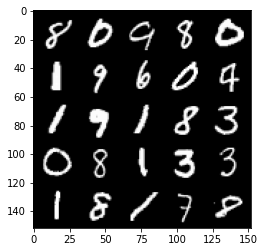

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18, step 8500: Generator loss: 4.217684928894045, discriminator loss: 0.06065031478926538


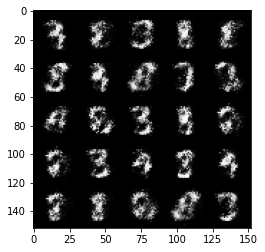

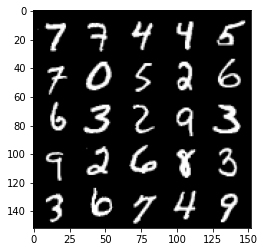

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 4.47522730541229, discriminator loss: 0.046161247745156286


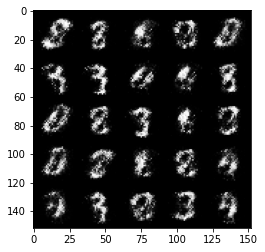

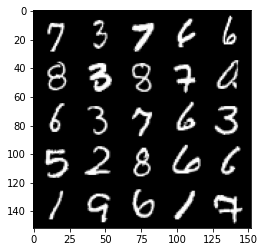

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20, step 9500: Generator loss: 4.443092961788181, discriminator loss: 0.04283788939937955


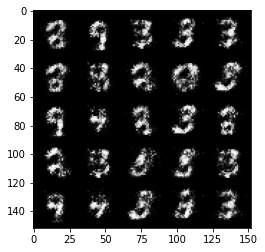

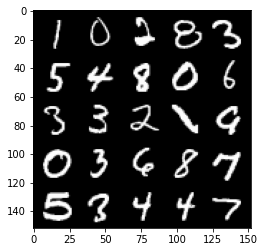

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 4.308487757682805, discriminator loss: 0.04914622054994104


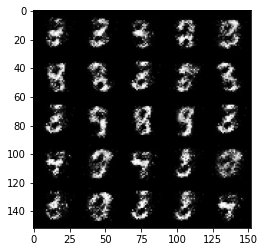

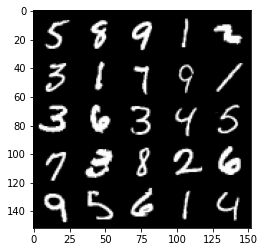

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22, step 10500: Generator loss: 4.253824759006498, discriminator loss: 0.05407202190160759


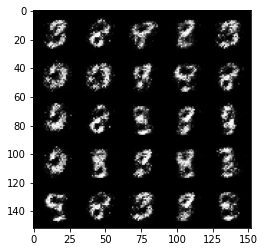

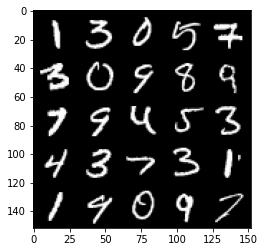

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 11000: Generator loss: 4.328219820022584, discriminator loss: 0.05858224246650933


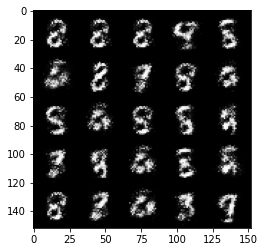

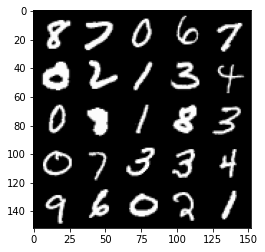

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24, step 11500: Generator loss: 4.260132926464083, discriminator loss: 0.05749528842419379


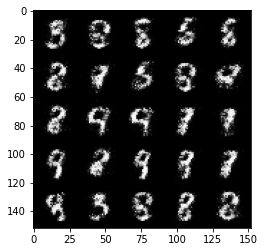

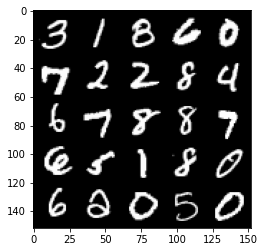

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 12000: Generator loss: 4.150211993694309, discriminator loss: 0.07700051355361939


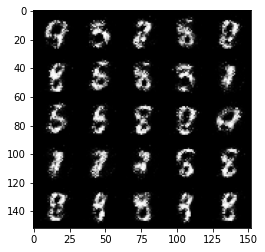

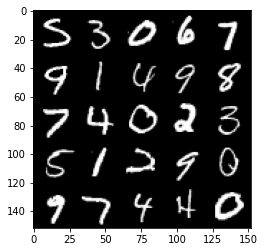

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26, step 12500: Generator loss: 4.273841399669646, discriminator loss: 0.07338382964208712


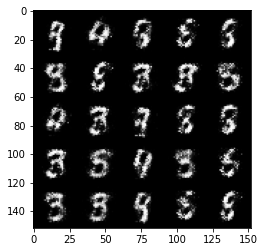

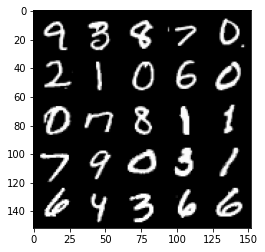

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 13000: Generator loss: 4.2124445490837115, discriminator loss: 0.07360099131613972


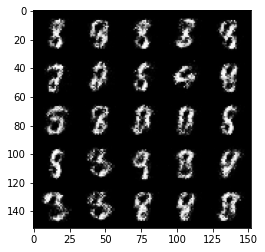

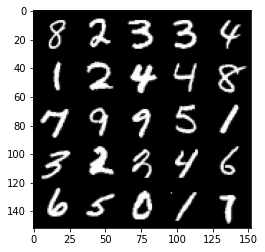

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28, step 13500: Generator loss: 4.095699087142946, discriminator loss: 0.08889912324398751


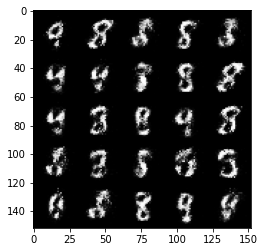

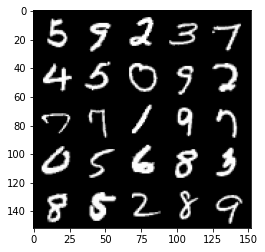

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 14000: Generator loss: 3.9387021837234526, discriminator loss: 0.09398846043646343


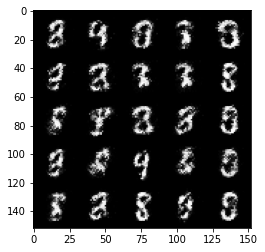

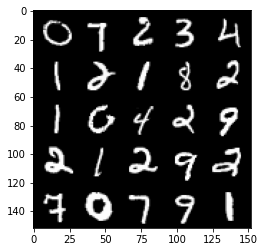

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30, step 14500: Generator loss: 3.86697677707672, discriminator loss: 0.10871480559557671


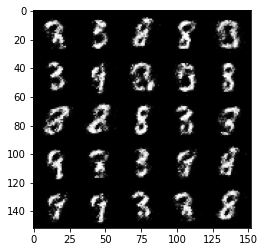

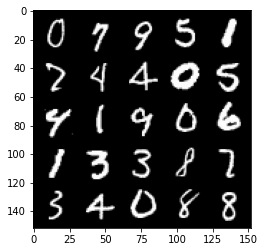

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 15000: Generator loss: 3.7730955038070673, discriminator loss: 0.0984215544909239


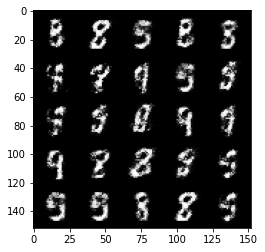

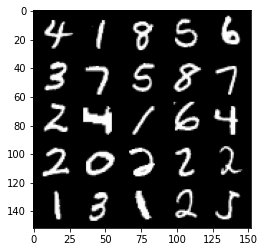

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33, step 15500: Generator loss: 3.7060437545776375, discriminator loss: 0.10396983361244196


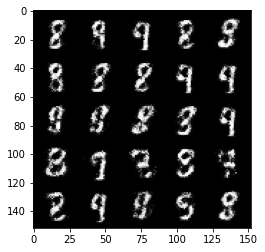

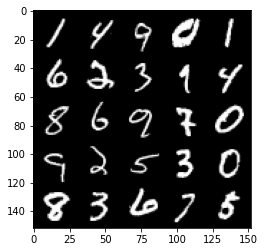

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 3.768043208599092, discriminator loss: 0.11289606578648091


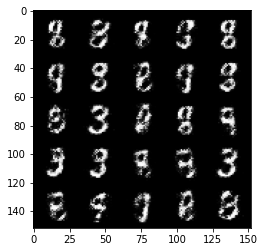

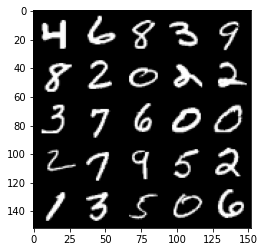

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35, step 16500: Generator loss: 3.46707961130142, discriminator loss: 0.14047543601691725


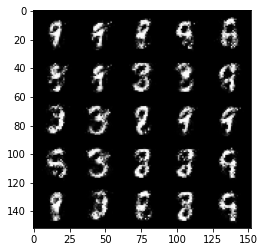

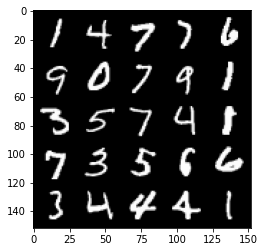

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 3.5678202018737806, discriminator loss: 0.12373705610632896


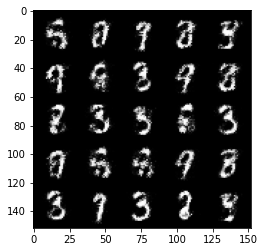

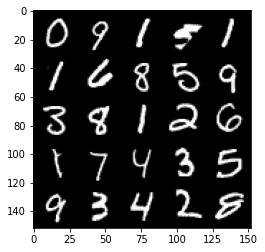

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37, step 17500: Generator loss: 3.442446425914761, discriminator loss: 0.1257605524063111


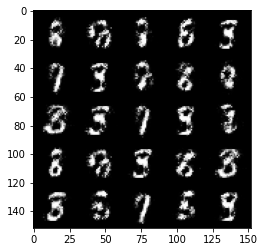

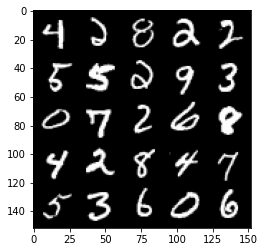

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 3.461730823993683, discriminator loss: 0.12854566799849268


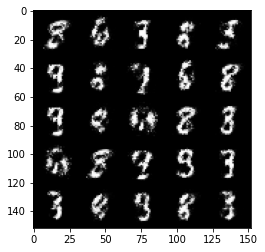

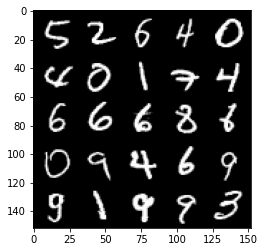

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39, step 18500: Generator loss: 3.4269799952507003, discriminator loss: 0.13071199110150328


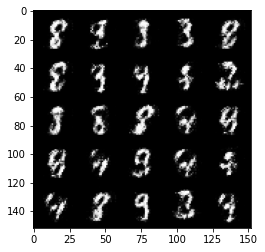

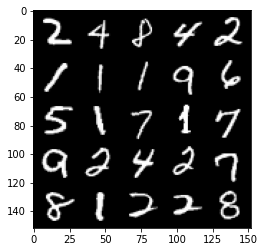

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 19000: Generator loss: 3.3678740525245656, discriminator loss: 0.13191544365882876


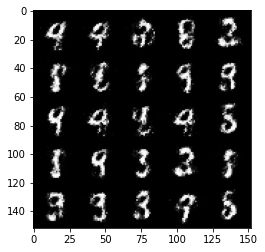

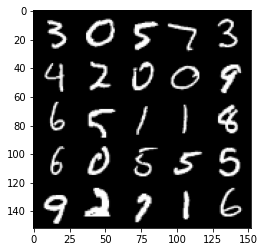

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41, step 19500: Generator loss: 3.382659874916076, discriminator loss: 0.13375614166259778


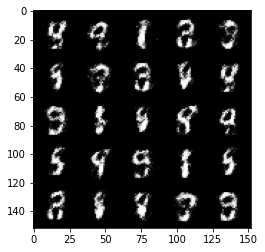

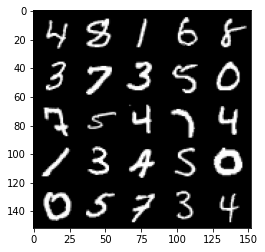

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 20000: Generator loss: 3.3395230054855323, discriminator loss: 0.14913079245388497


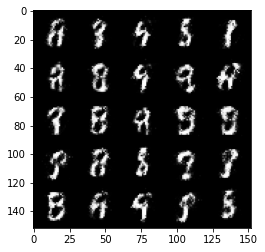

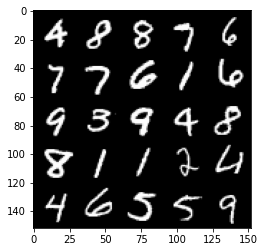

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43, step 20500: Generator loss: 3.307708045959476, discriminator loss: 0.13212694774568087


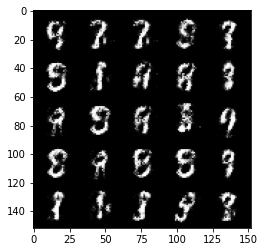

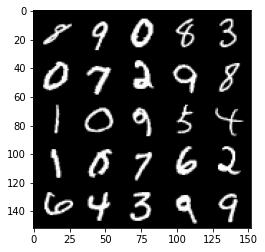

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 21000: Generator loss: 3.3143576073646517, discriminator loss: 0.15115691454708574


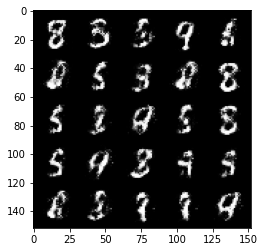

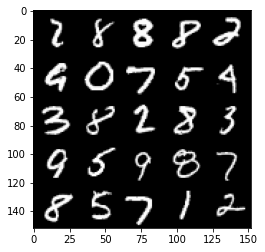

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45, step 21500: Generator loss: 3.213001270294189, discriminator loss: 0.14525443632155663


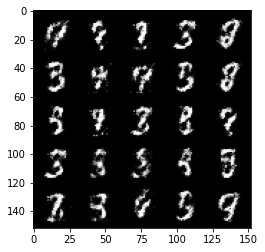

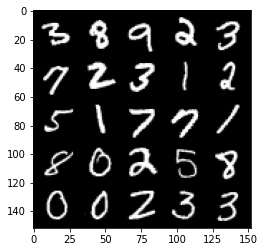

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 22000: Generator loss: 3.3142355918884316, discriminator loss: 0.12968018606305115


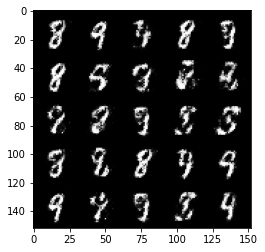

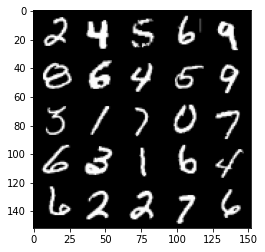

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47, step 22500: Generator loss: 3.3553735580444357, discriminator loss: 0.14239774295687663


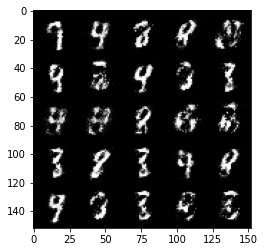

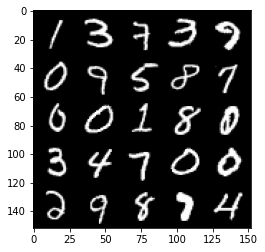

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49, step 23000: Generator loss: 3.184671869277958, discriminator loss: 0.15272735415399083


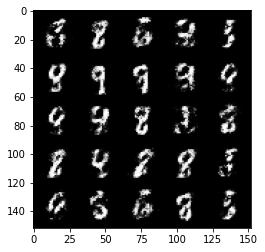

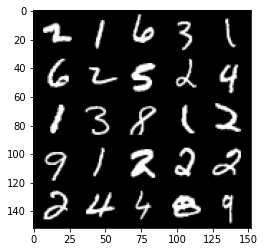

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 50, step 23500: Generator loss: 3.052988787651059, discriminator loss: 0.1686241239458323


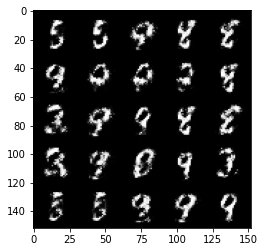

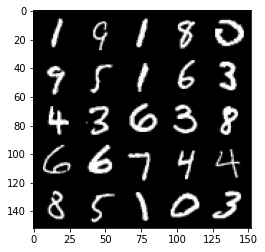

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 51, step 24000: Generator loss: 3.139090362071991, discriminator loss: 0.1525720573514701


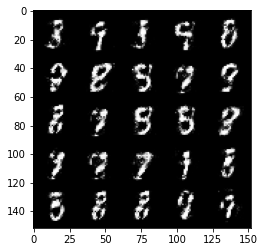

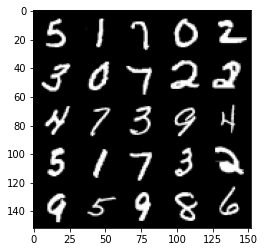

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 52, step 24500: Generator loss: 2.9897579841613777, discriminator loss: 0.17070133186876768


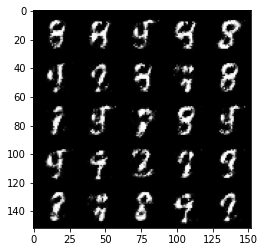

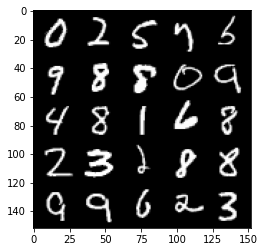

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 53, step 25000: Generator loss: 3.0095098085403453, discriminator loss: 0.18040863165259355


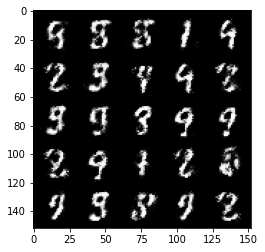

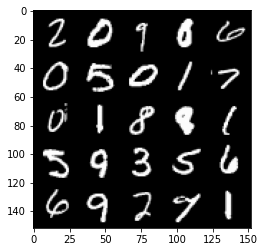

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 54, step 25500: Generator loss: 2.8586151237487796, discriminator loss: 0.18749140307307263


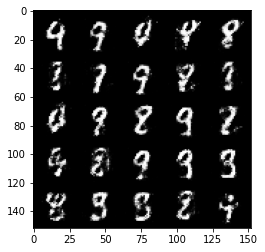

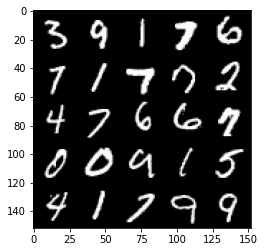

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 55, step 26000: Generator loss: 2.8982952175140375, discriminator loss: 0.18340364401042464


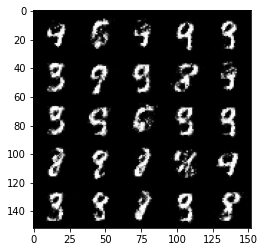

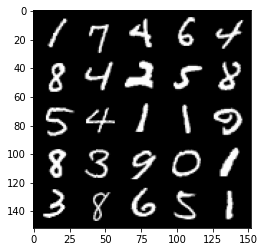

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 56, step 26500: Generator loss: 2.7794769043922414, discriminator loss: 0.20024646380543715


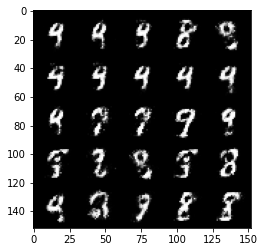

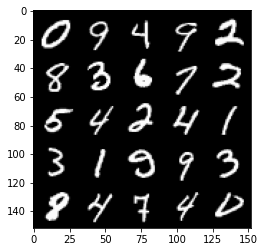

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 57, step 27000: Generator loss: 2.5912779121398906, discriminator loss: 0.22661374375224103


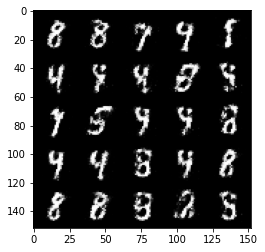

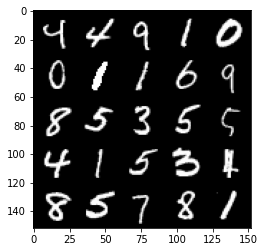

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 58, step 27500: Generator loss: 2.5833534641265867, discriminator loss: 0.21089768846333007


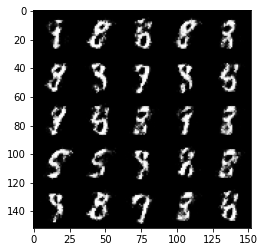

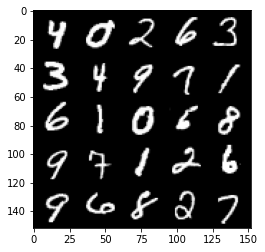

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 59, step 28000: Generator loss: 2.7378353991508493, discriminator loss: 0.19746077397465692


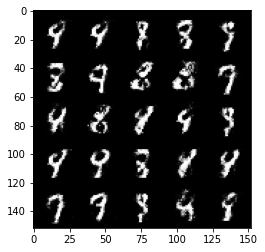

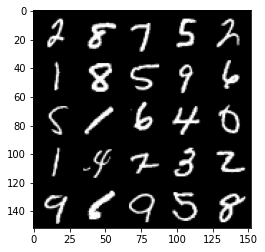

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 60, step 28500: Generator loss: 2.6701706900596625, discriminator loss: 0.2037741622924805


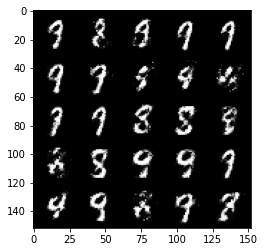

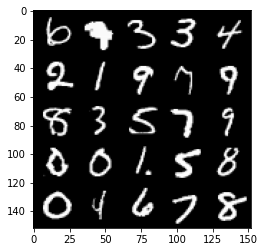

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 61, step 29000: Generator loss: 2.7819611892700213, discriminator loss: 0.18678027550876158


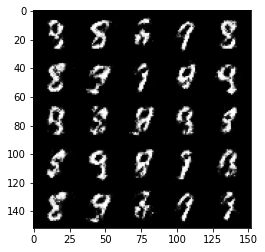

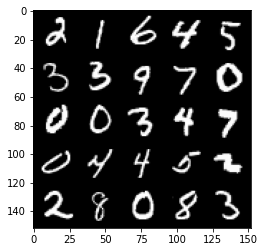

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 62, step 29500: Generator loss: 2.706766691207886, discriminator loss: 0.19059209370613092


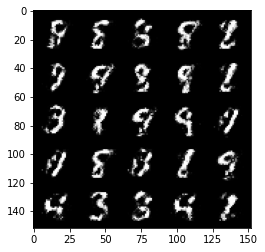

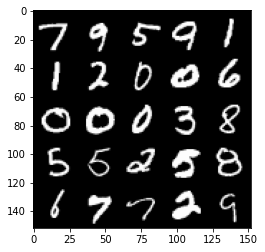

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 63, step 30000: Generator loss: 2.8708548178672766, discriminator loss: 0.18136749616265288


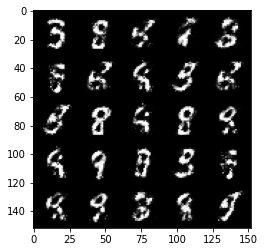

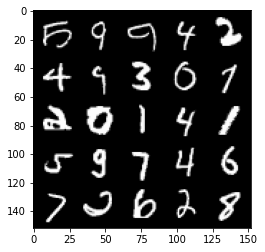

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 65, step 30500: Generator loss: 2.6036660799980162, discriminator loss: 0.22361653512716292


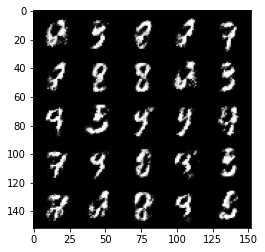

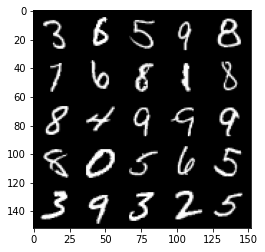

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 66, step 31000: Generator loss: 2.6488372297286964, discriminator loss: 0.21919186985492697


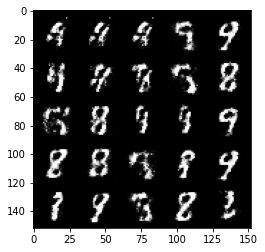

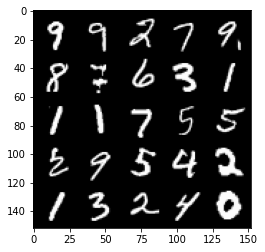

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 67, step 31500: Generator loss: 2.5530565237998952, discriminator loss: 0.22588093350827693


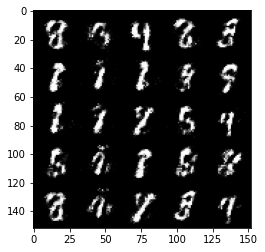

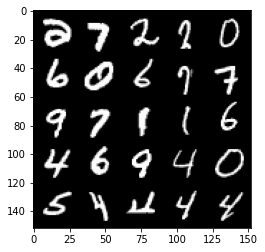

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 68, step 32000: Generator loss: 2.6188306233882885, discriminator loss: 0.21637386465072656


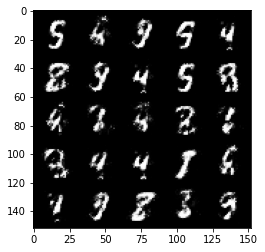

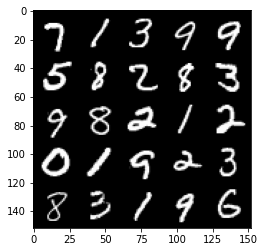

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 69, step 32500: Generator loss: 2.554248451709746, discriminator loss: 0.2329461209774016


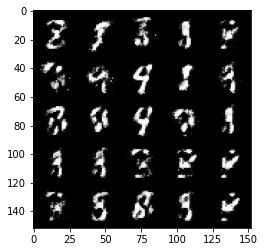

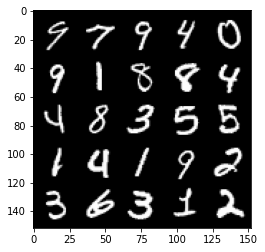

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 70, step 33000: Generator loss: 2.2999358804225905, discriminator loss: 0.26551945367455476


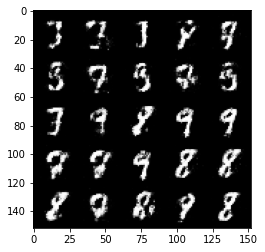

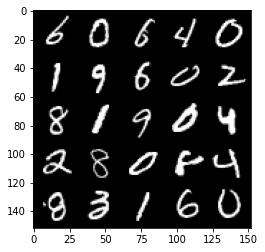

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 71, step 33500: Generator loss: 2.307752203464511, discriminator loss: 0.267206490725279


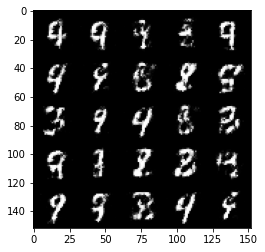

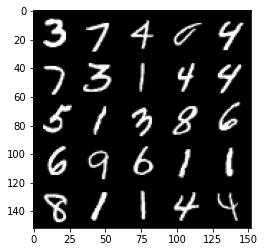

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 72, step 34000: Generator loss: 2.1919318826198584, discriminator loss: 0.2797362601161004


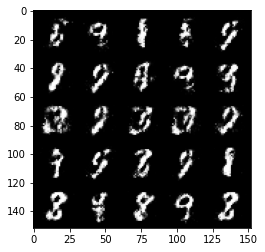

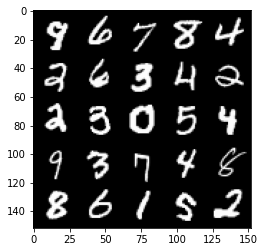

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 73, step 34500: Generator loss: 2.26022102689743, discriminator loss: 0.2633145668208599


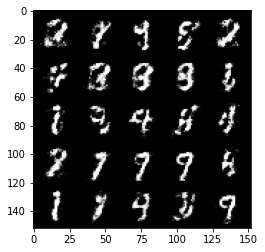

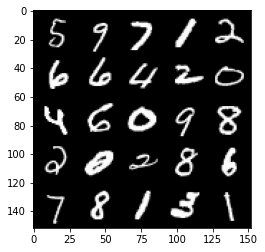

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 74, step 35000: Generator loss: 2.2177459669113153, discriminator loss: 0.2835519663989543


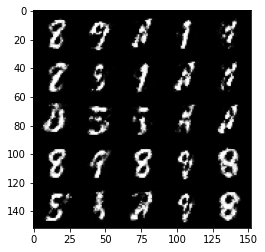

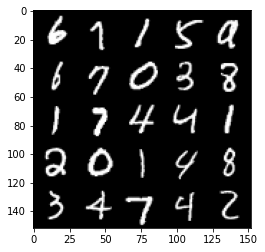

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 75, step 35500: Generator loss: 2.1289955065250394, discriminator loss: 0.28099407109618196


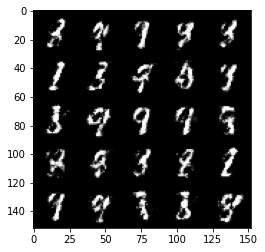

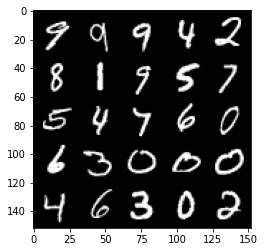

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 76, step 36000: Generator loss: 2.170459282159805, discriminator loss: 0.29228201401233694


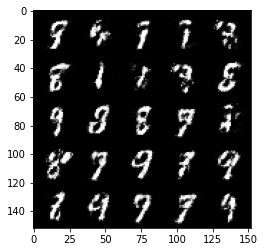

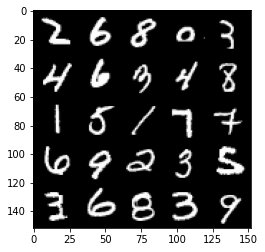

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 77, step 36500: Generator loss: 2.110916345119479, discriminator loss: 0.2888526235222817


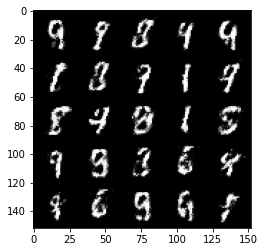

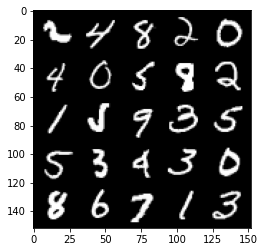

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 78, step 37000: Generator loss: 2.0614010972976677, discriminator loss: 0.30611513361334824


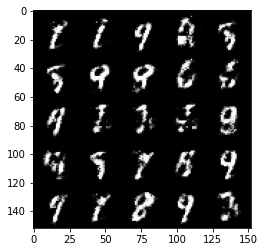

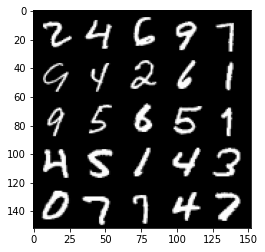

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 79, step 37500: Generator loss: 2.0631201221942916, discriminator loss: 0.2967837801277637


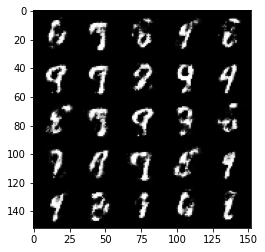

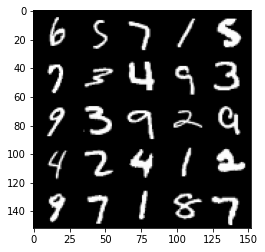

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 81, step 38000: Generator loss: 2.158694351911544, discriminator loss: 0.29025794243812575


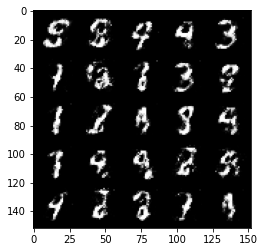

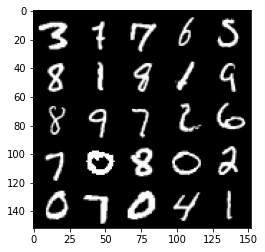

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 82, step 38500: Generator loss: 2.0588876533508293, discriminator loss: 0.30662797483801807


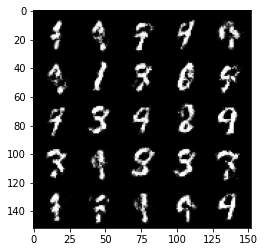

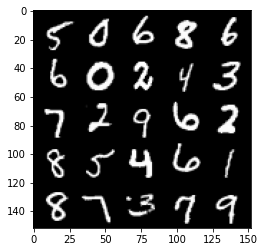

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 83, step 39000: Generator loss: 2.0184946839809417, discriminator loss: 0.31591011452674883


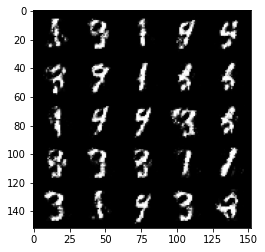

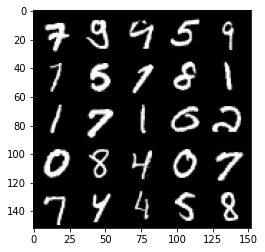

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 84, step 39500: Generator loss: 1.9680134372711178, discriminator loss: 0.32391594794392614


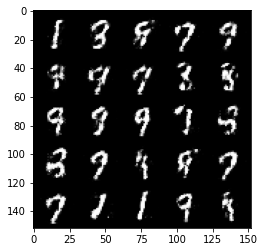

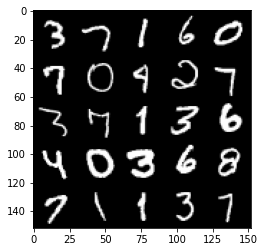

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 85, step 40000: Generator loss: 1.9799368958473225, discriminator loss: 0.31002321475744266


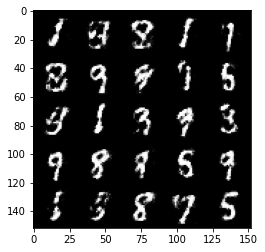

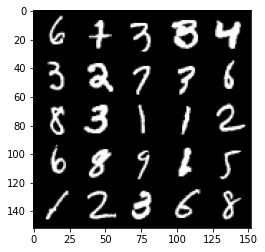

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 86, step 40500: Generator loss: 1.9369331483840926, discriminator loss: 0.32657823222875626


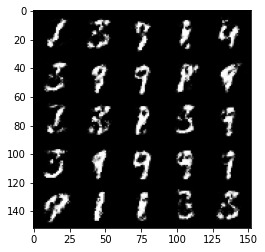

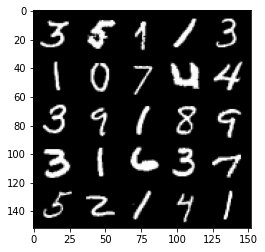

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 87, step 41000: Generator loss: 1.8820000638961805, discriminator loss: 0.33677972245216375


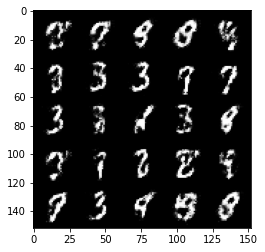

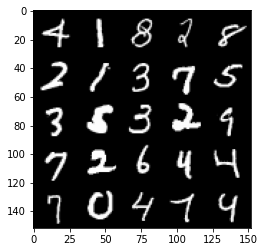

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 88, step 41500: Generator loss: 1.9181097981929793, discriminator loss: 0.33316826096177105


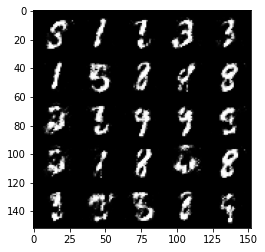

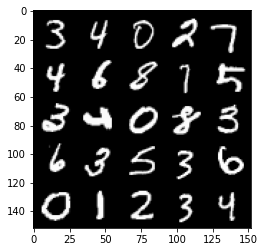

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 89, step 42000: Generator loss: 2.000364609956742, discriminator loss: 0.31017977145314185


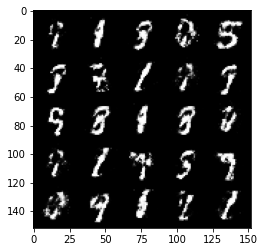

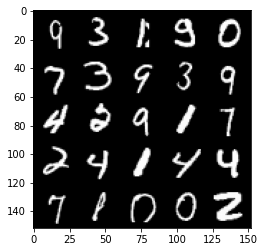

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 90, step 42500: Generator loss: 1.9427652578353884, discriminator loss: 0.3292126338183878


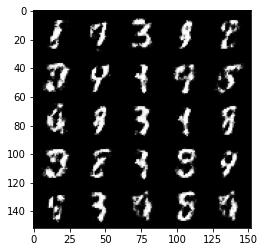

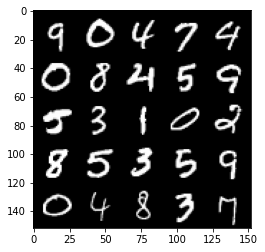

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 91, step 43000: Generator loss: 2.0603102564811713, discriminator loss: 0.29009210509061795


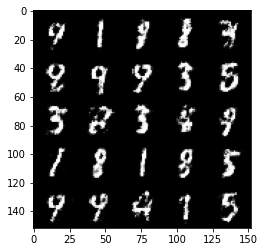

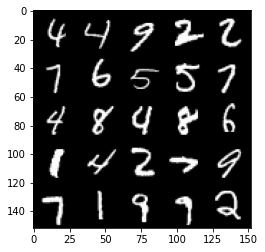

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 92, step 43500: Generator loss: 2.049821084976197, discriminator loss: 0.30947404080629337


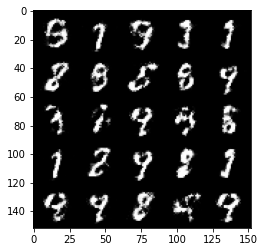

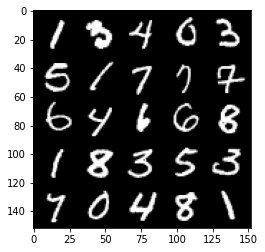

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 93, step 44000: Generator loss: 1.9279983723163592, discriminator loss: 0.3246395941674706


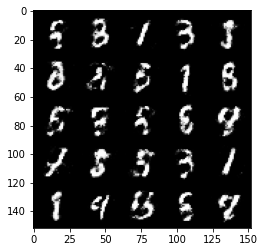

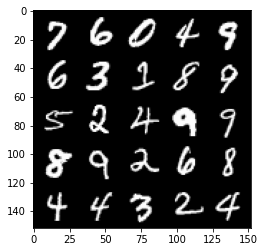

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 94, step 44500: Generator loss: 1.921663821458815, discriminator loss: 0.3422802467346195


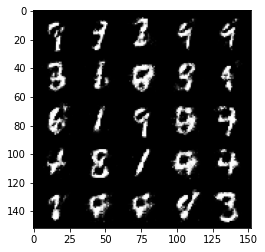

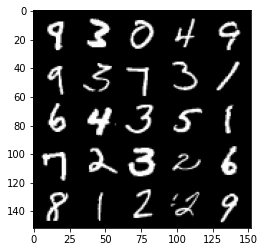

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 95, step 45000: Generator loss: 1.8136450853347783, discriminator loss: 0.3468955644965172


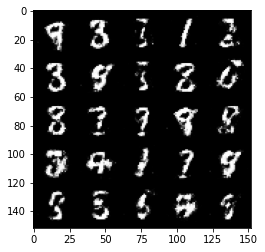

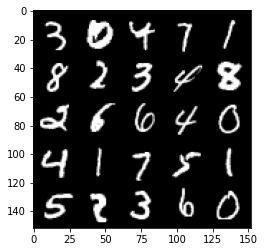

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 97, step 45500: Generator loss: 1.8863106462955481, discriminator loss: 0.337519806176424


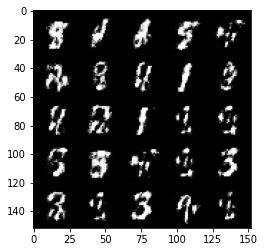

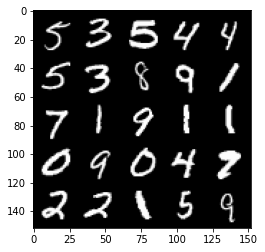

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 98, step 46000: Generator loss: 1.8114014194011685, discriminator loss: 0.340974673360586


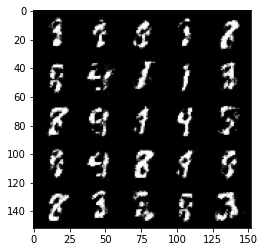

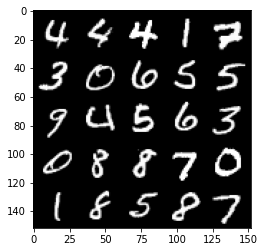

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 99, step 46500: Generator loss: 1.923281196594238, discriminator loss: 0.3279777767956254


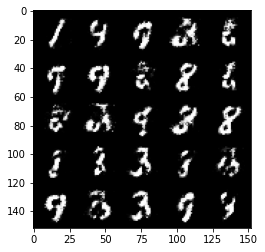

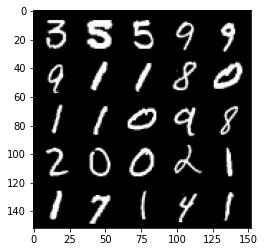

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 100, step 47000: Generator loss: 1.8977917885780329, discriminator loss: 0.3358051602840425


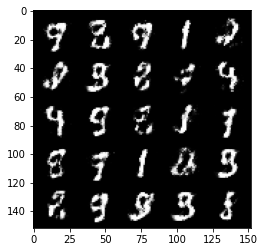

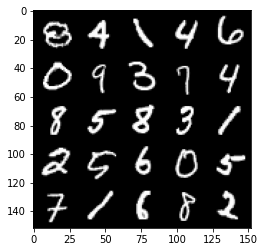

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 101, step 47500: Generator loss: 1.8480351772308345, discriminator loss: 0.34764697766304


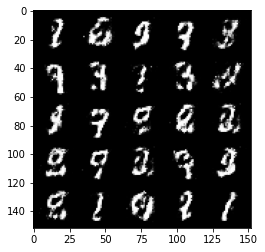

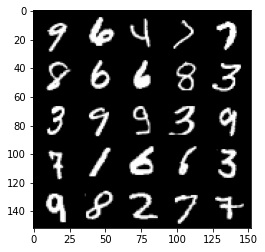

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 102, step 48000: Generator loss: 1.803716673135758, discriminator loss: 0.35486679959297196


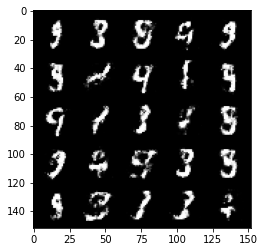

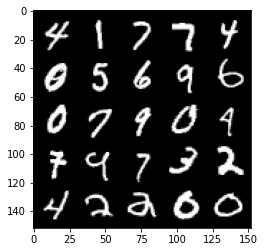

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 103, step 48500: Generator loss: 1.8449574582576753, discriminator loss: 0.33776849833130873


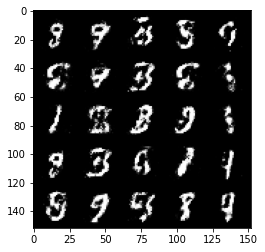

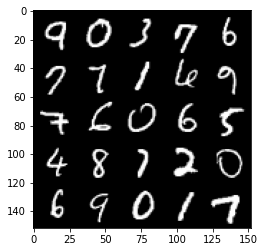

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 104, step 49000: Generator loss: 1.7975768582820888, discriminator loss: 0.3486190655231477


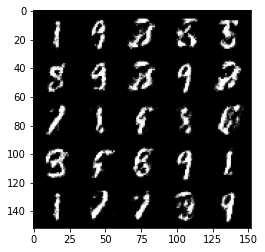

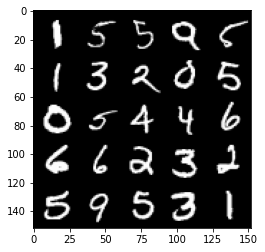

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 105, step 49500: Generator loss: 1.7366682684421548, discriminator loss: 0.3659055693745616


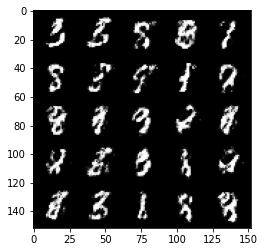

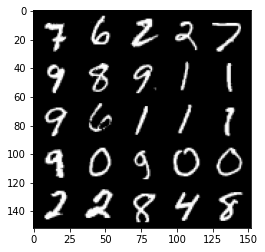

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 106, step 50000: Generator loss: 1.5932799115180971, discriminator loss: 0.40619030612707124


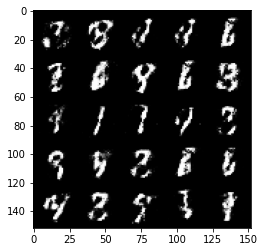

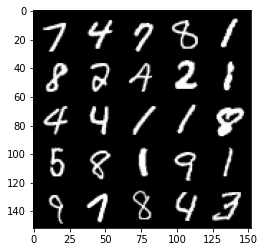

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 107, step 50500: Generator loss: 1.6272928676605212, discriminator loss: 0.37634178394079165


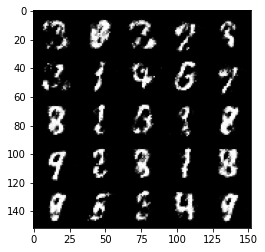

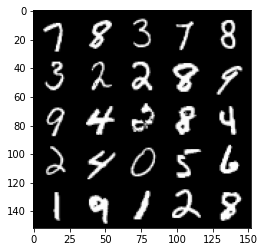

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 108, step 51000: Generator loss: 1.7164287071228033, discriminator loss: 0.35916916668415055


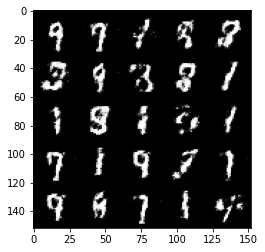

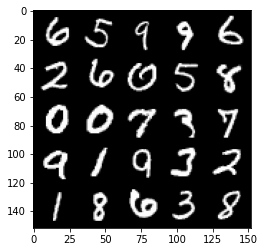

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 109, step 51500: Generator loss: 1.6928502461910255, discriminator loss: 0.37857187113165863


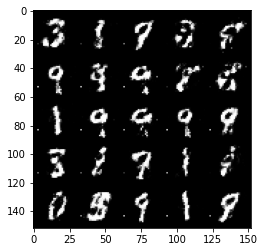

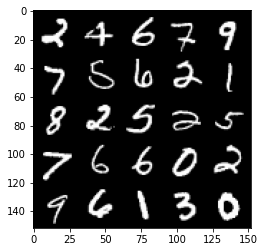

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 110, step 52000: Generator loss: 1.7205009808540344, discriminator loss: 0.3614234232902532


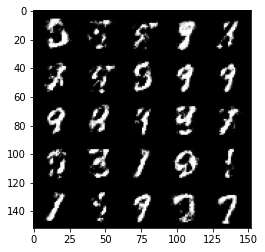

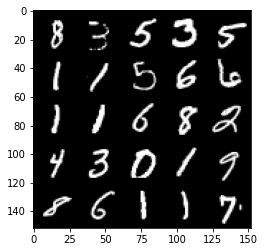

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 111, step 52500: Generator loss: 1.6182634005546577, discriminator loss: 0.38576098048686996


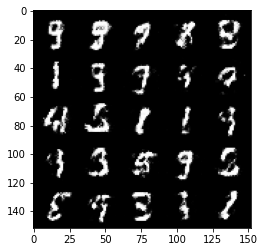

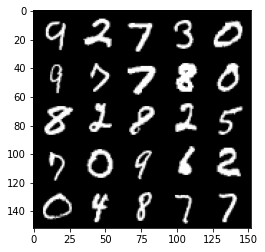

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 113, step 53000: Generator loss: 1.6425833532810197, discriminator loss: 0.36349760603904757


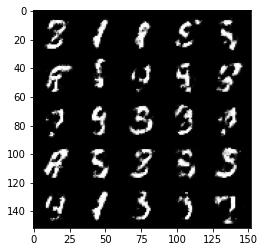

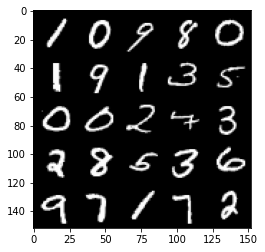

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 114, step 53500: Generator loss: 1.717365095853805, discriminator loss: 0.368269742310047


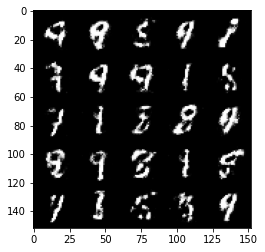

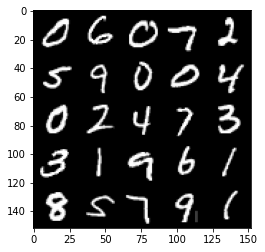

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 115, step 54000: Generator loss: 1.636205822467805, discriminator loss: 0.3814402842521665


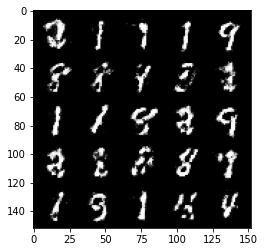

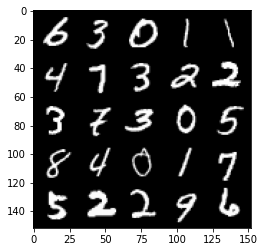

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 116, step 54500: Generator loss: 1.5929121270179747, discriminator loss: 0.3933286080360413


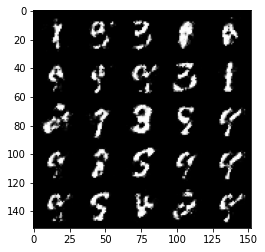

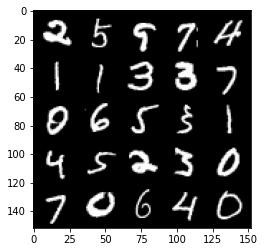

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 117, step 55000: Generator loss: 1.6043346574306507, discriminator loss: 0.37959930467605596


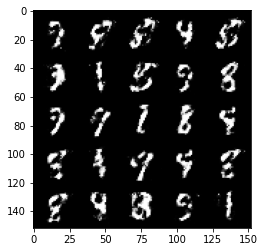

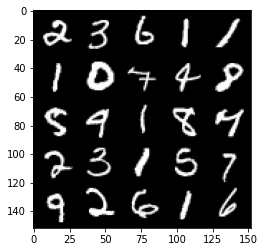

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 118, step 55500: Generator loss: 1.6702181649208065, discriminator loss: 0.3665278733372686


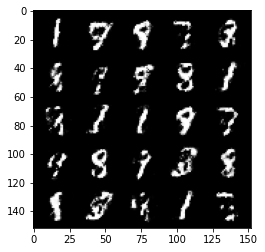

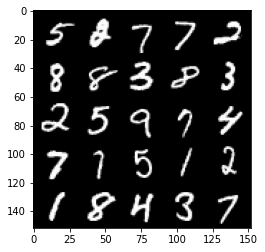

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 119, step 56000: Generator loss: 1.6109825055599214, discriminator loss: 0.3883042306900024


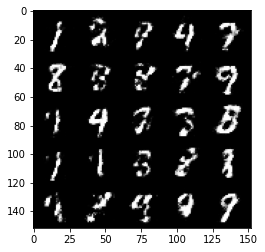

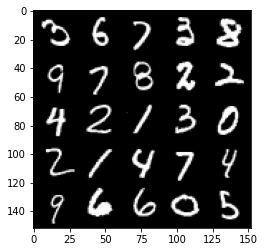

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 120, step 56500: Generator loss: 1.599089877605439, discriminator loss: 0.38318913626670814


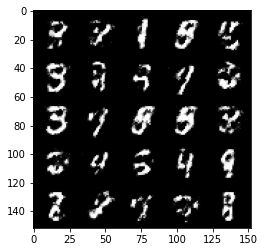

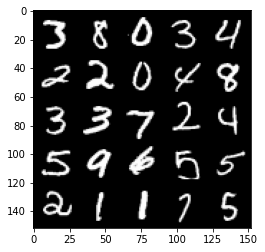

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 121, step 57000: Generator loss: 1.592324615001678, discriminator loss: 0.397979119479656


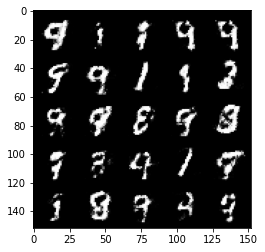

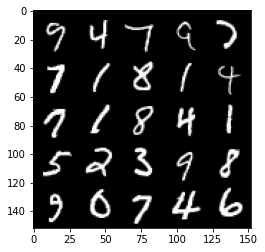

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 122, step 57500: Generator loss: 1.5477236368656158, discriminator loss: 0.3995159609317776


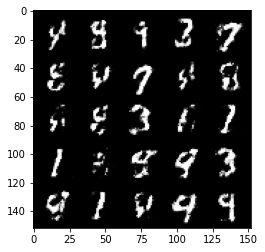

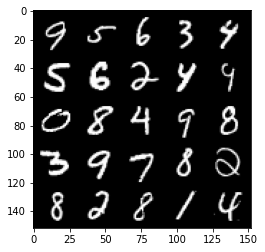

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 123, step 58000: Generator loss: 1.5722239766120913, discriminator loss: 0.3899456857442853


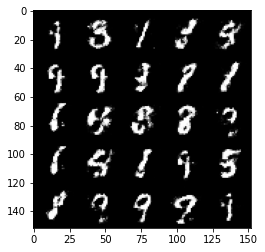

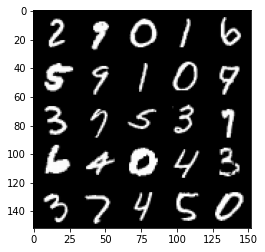

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 124, step 58500: Generator loss: 1.5902647175788887, discriminator loss: 0.3835730068683629


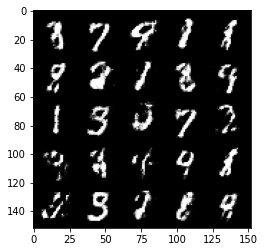

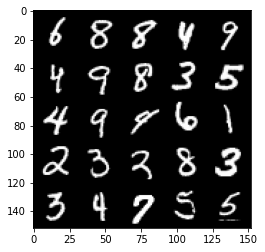

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 125, step 59000: Generator loss: 1.5338366498947136, discriminator loss: 0.41065849179029457


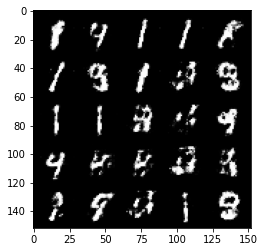

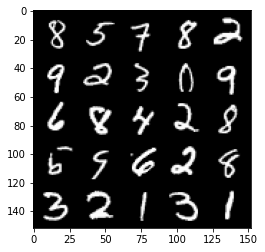

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 126, step 59500: Generator loss: 1.5306746027469629, discriminator loss: 0.3977653651833537


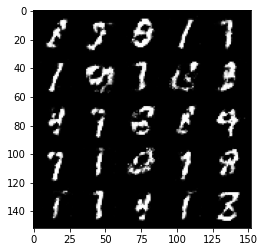

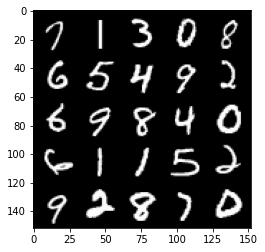

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 127, step 60000: Generator loss: 1.6141445116996775, discriminator loss: 0.3894227620959286


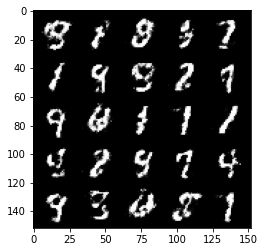

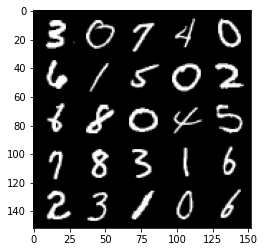

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 128, step 60500: Generator loss: 1.4720456740856172, discriminator loss: 0.42100319391488983


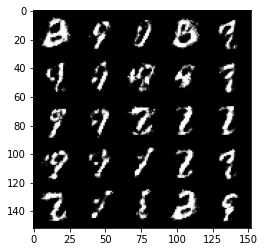

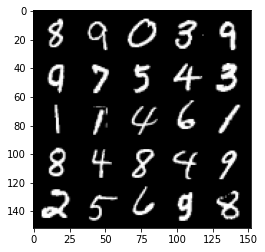

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 130, step 61000: Generator loss: 1.5747786612510697, discriminator loss: 0.3825260267853738


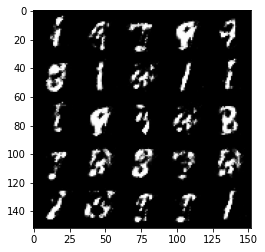

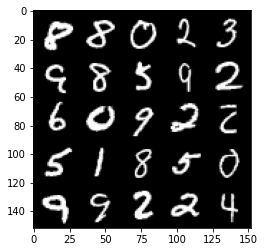

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 131, step 61500: Generator loss: 1.385323146820068, discriminator loss: 0.4623924682140354


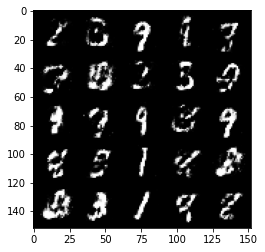

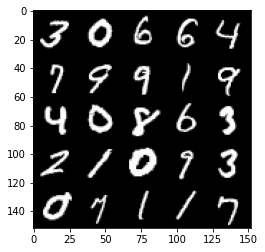

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 132, step 62000: Generator loss: 1.3377498645782469, discriminator loss: 0.4519085233807564


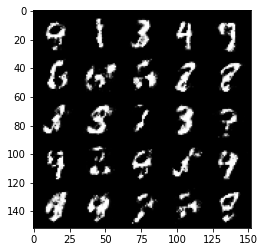

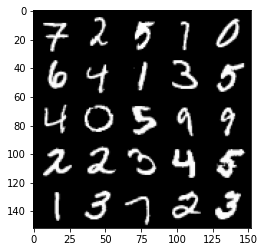

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 133, step 62500: Generator loss: 1.4792952589988706, discriminator loss: 0.4199088169932365


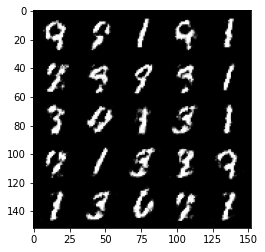

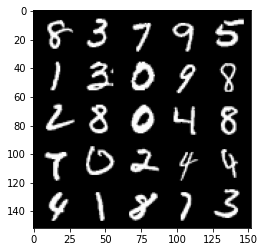

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 134, step 63000: Generator loss: 1.4732645134925846, discriminator loss: 0.4224469298124309


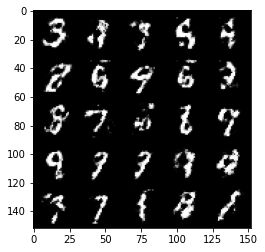

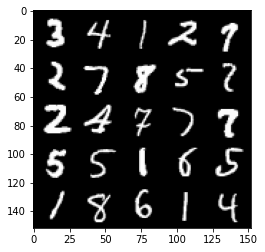

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 135, step 63500: Generator loss: 1.4546867842674254, discriminator loss: 0.4147741733193399


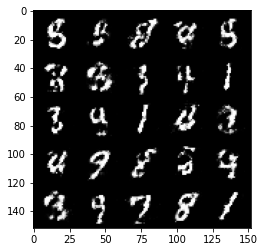

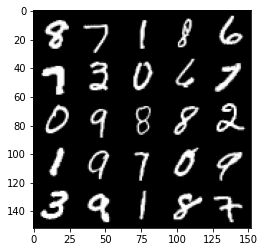

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 136, step 64000: Generator loss: 1.4276835484504713, discriminator loss: 0.4363502107262608


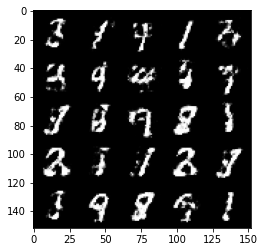

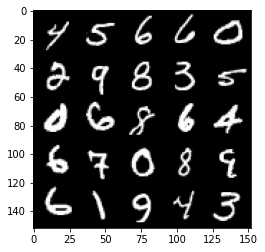

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 137, step 64500: Generator loss: 1.4430961728096008, discriminator loss: 0.4133273058533665


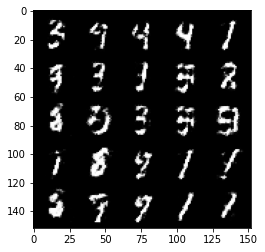

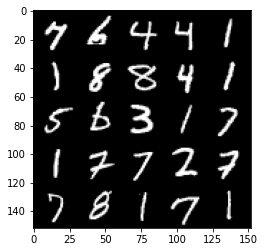

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 138, step 65000: Generator loss: 1.4961936099529252, discriminator loss: 0.41089770287275323


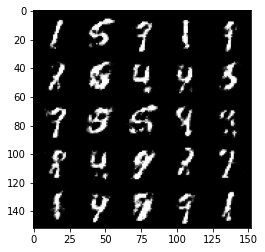

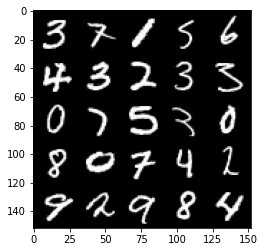

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 139, step 65500: Generator loss: 1.4546723728179938, discriminator loss: 0.4206754136085508


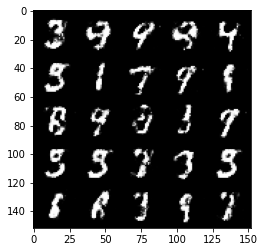

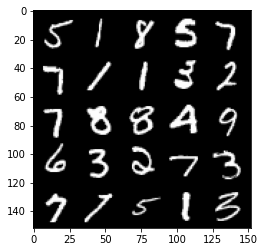

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 140, step 66000: Generator loss: 1.4878776266574838, discriminator loss: 0.4029906069040295


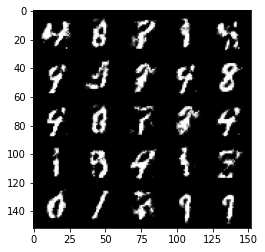

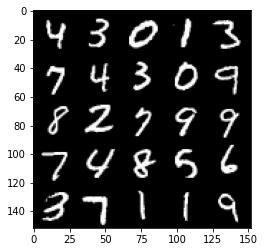

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 141, step 66500: Generator loss: 1.4087583119869238, discriminator loss: 0.43703899163007726


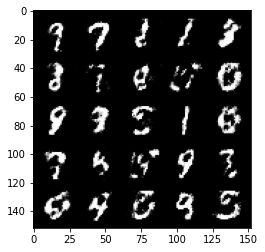

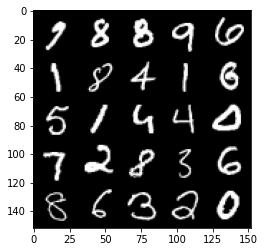

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 142, step 67000: Generator loss: 1.4410352761745442, discriminator loss: 0.41738839429616914


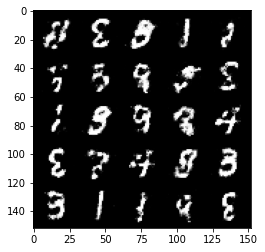

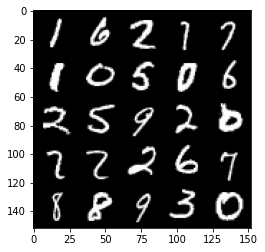

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 143, step 67500: Generator loss: 1.3262029941082003, discriminator loss: 0.45506980627775223


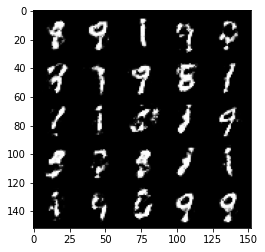

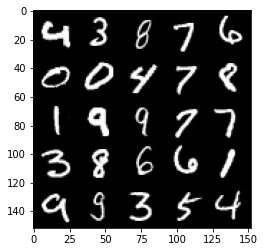

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 144, step 68000: Generator loss: 1.3031391260623941, discriminator loss: 0.4645474008917807


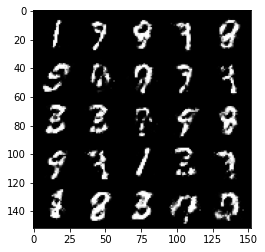

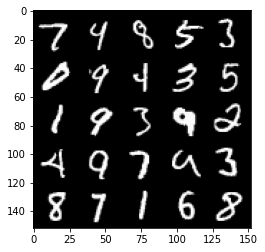

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 146, step 68500: Generator loss: 1.2657071669101727, discriminator loss: 0.47772786170244214


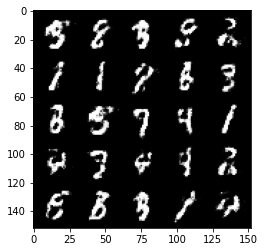

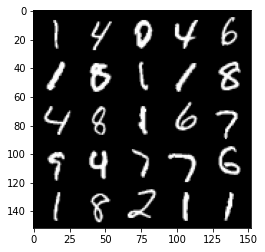

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 147, step 69000: Generator loss: 1.3439322998523704, discriminator loss: 0.4440029181241988


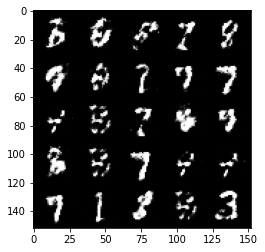

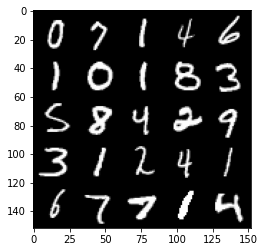

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 148, step 69500: Generator loss: 1.3797423946857448, discriminator loss: 0.4498369456529619


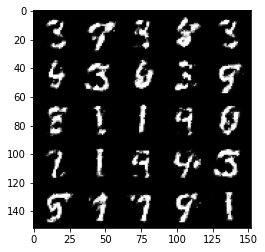

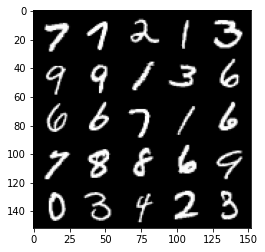

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 149, step 70000: Generator loss: 1.3344917953014386, discriminator loss: 0.46561027795076376


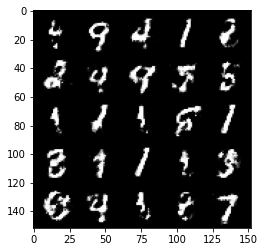

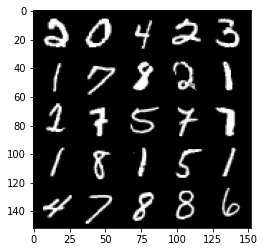

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 150, step 70500: Generator loss: 1.3481825175285334, discriminator loss: 0.4502453199028965


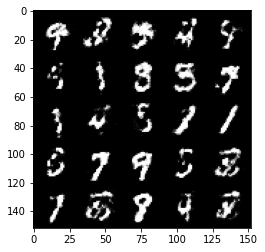

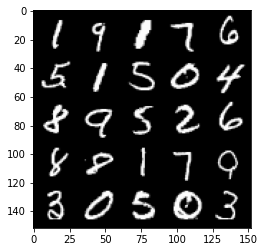

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 151, step 71000: Generator loss: 1.2852326757907868, discriminator loss: 0.46298151117563274


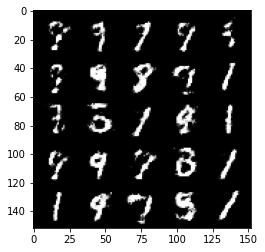

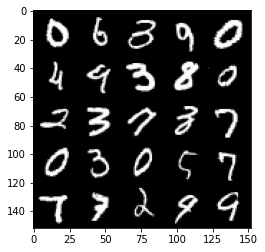

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 152, step 71500: Generator loss: 1.2645444133281707, discriminator loss: 0.47601955801248536


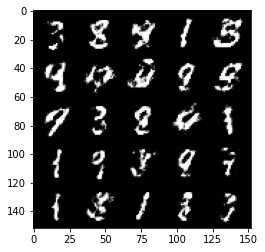

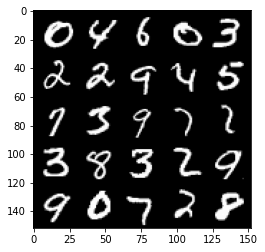

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 153, step 72000: Generator loss: 1.2624881336689007, discriminator loss: 0.4701289575099945


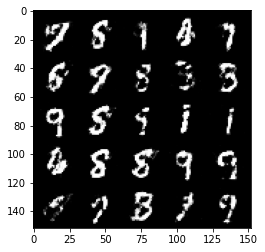

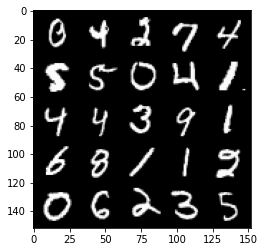

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 154, step 72500: Generator loss: 1.1889369385242454, discriminator loss: 0.5756544435620312


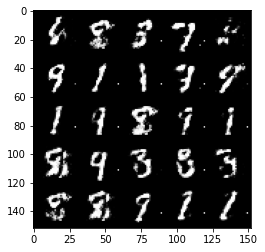

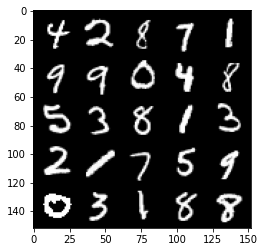

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 155, step 73000: Generator loss: 1.1150857325792314, discriminator loss: 0.4990639740824699


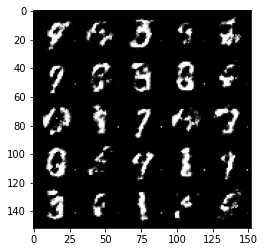

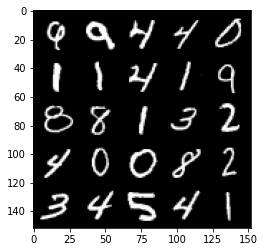

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 156, step 73500: Generator loss: 1.2457387287616726, discriminator loss: 0.479289307117462


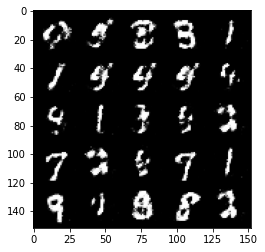

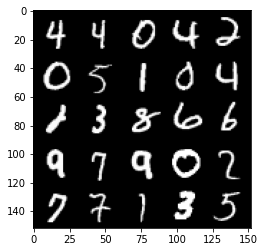

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 157, step 74000: Generator loss: 1.287649328231811, discriminator loss: 0.45504310595989256


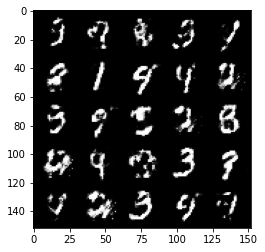

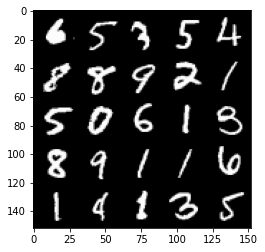

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 158, step 74500: Generator loss: 1.2385707652568818, discriminator loss: 0.4703521665334701


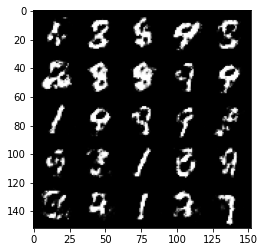

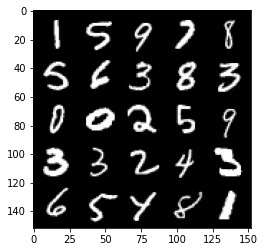

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 159, step 75000: Generator loss: 1.2440171158313735, discriminator loss: 0.47618465620279266


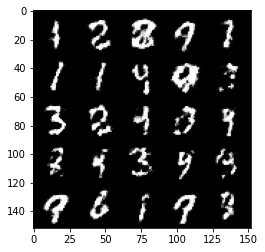

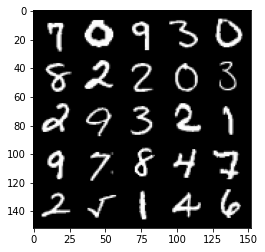

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 160, step 75500: Generator loss: 1.2221933987140647, discriminator loss: 0.490536270260811


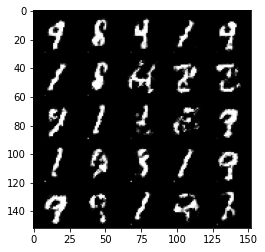

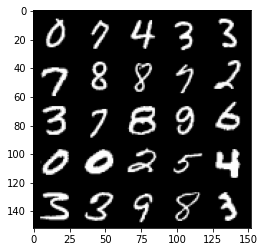

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 162, step 76000: Generator loss: 1.2673184096813193, discriminator loss: 0.46747504943609236


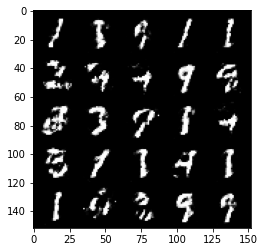

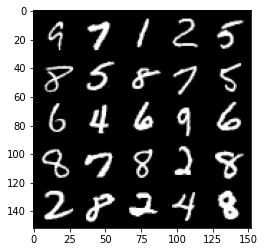

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 163, step 76500: Generator loss: 1.2440040197372437, discriminator loss: 0.47914027917385077


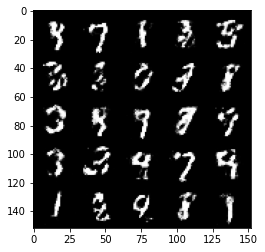

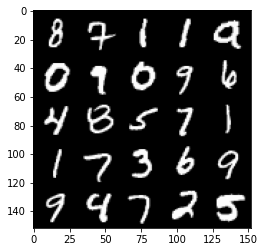

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 164, step 77000: Generator loss: 1.1743500790596, discriminator loss: 0.49437936955690337


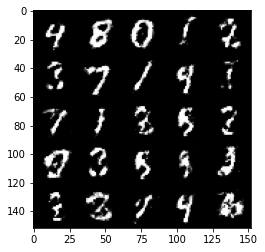

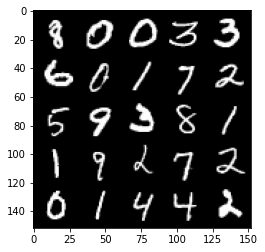

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 165, step 77500: Generator loss: 1.1855938544273372, discriminator loss: 0.4927480940222743


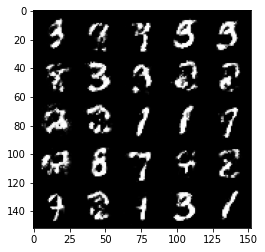

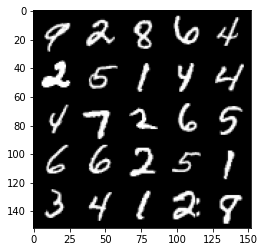

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 166, step 78000: Generator loss: 1.173609081745146, discriminator loss: 0.49644746279716495


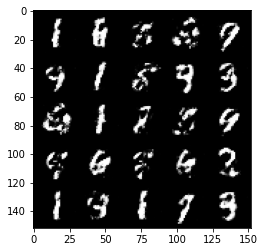

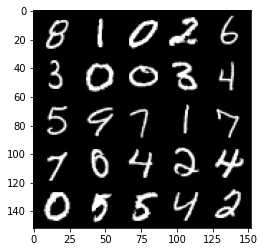

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 167, step 78500: Generator loss: 1.2118372843265535, discriminator loss: 0.48968941509723696


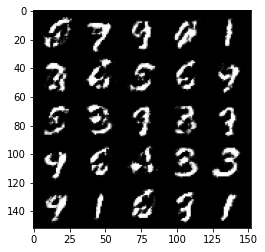

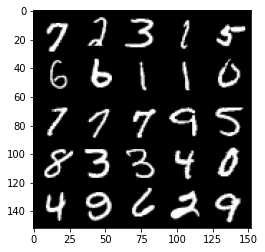

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 168, step 79000: Generator loss: 1.2163438513278957, discriminator loss: 0.49215106844902035


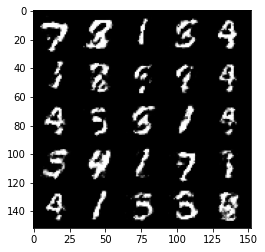

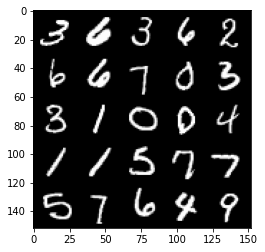

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 169, step 79500: Generator loss: 1.1656074483394607, discriminator loss: 0.4977385145425795


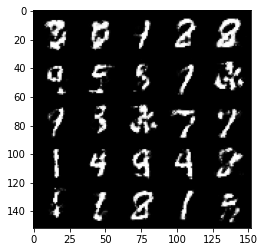

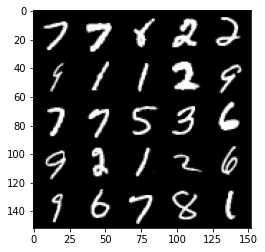

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 170, step 80000: Generator loss: 1.1776062180995943, discriminator loss: 0.49713990259170504


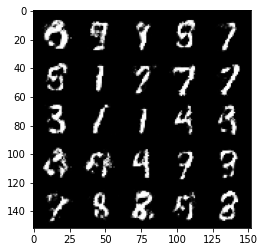

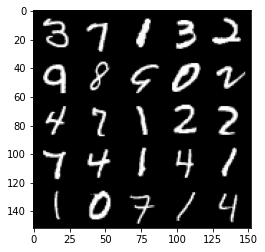

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 171, step 80500: Generator loss: 1.117986734509469, discriminator loss: 0.5122308295965193


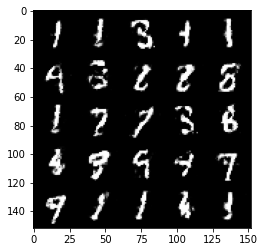

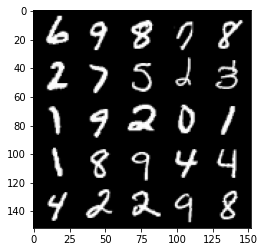

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 172, step 81000: Generator loss: 1.1674644036293031, discriminator loss: 0.5011207993030549


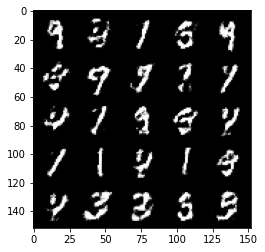

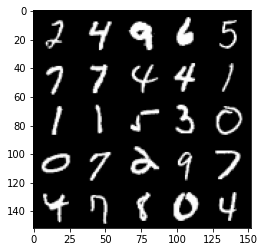

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 173, step 81500: Generator loss: 1.1418212726116173, discriminator loss: 0.5014357593059543


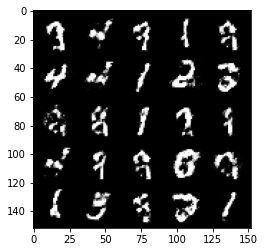

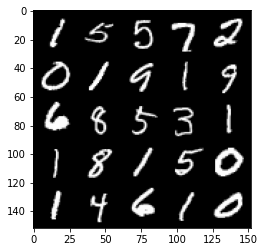

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 174, step 82000: Generator loss: 1.149686112523079, discriminator loss: 0.5035622140765192


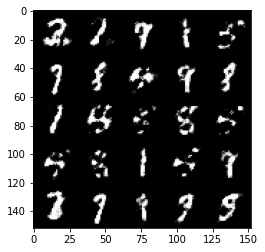

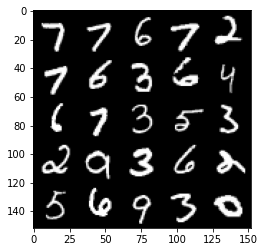

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 175, step 82500: Generator loss: 1.1417151209115988, discriminator loss: 0.5047309190630912


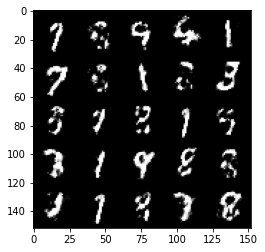

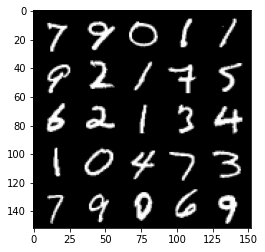

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 176, step 83000: Generator loss: 1.2021574022769936, discriminator loss: 0.48738349896669425


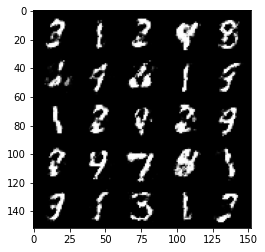

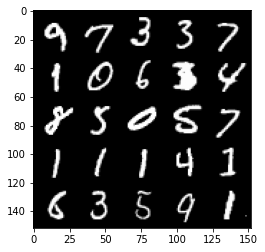

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 178, step 83500: Generator loss: 1.1661458578109736, discriminator loss: 0.50277988755703


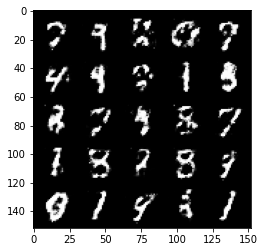

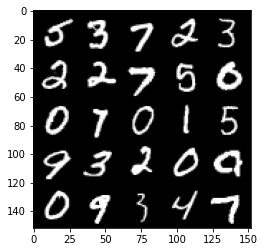

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 179, step 84000: Generator loss: 1.1417236551046372, discriminator loss: 0.5124050579071042


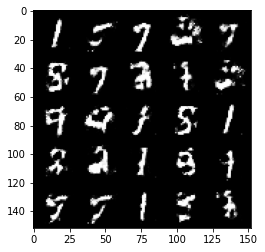

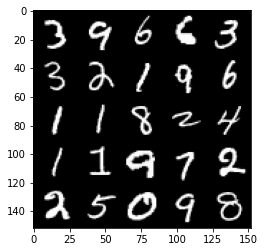

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 180, step 84500: Generator loss: 1.098059838294983, discriminator loss: 0.5290640385150913


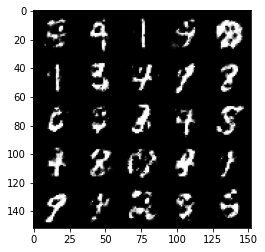

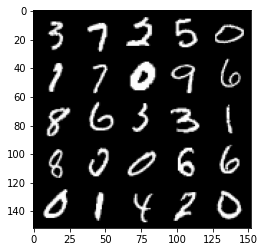

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 181, step 85000: Generator loss: 1.1360807240009299, discriminator loss: 0.5168925224542618


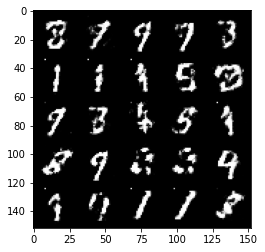

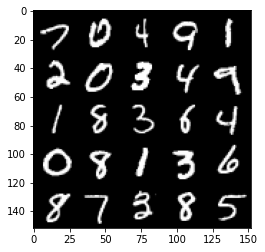

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 182, step 85500: Generator loss: 1.1398630914688117, discriminator loss: 0.5044040141105659


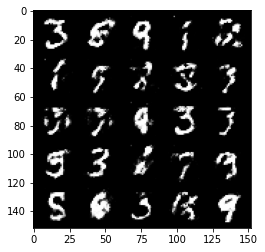

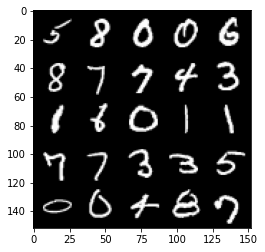

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 183, step 86000: Generator loss: 1.1725534433126448, discriminator loss: 0.487154699921608


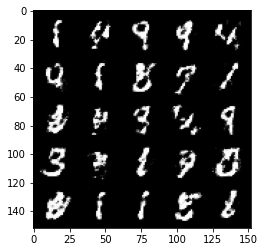

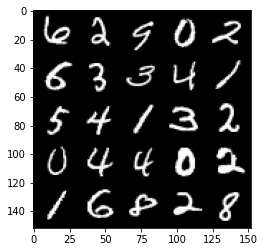

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 184, step 86500: Generator loss: 1.1871412370204937, discriminator loss: 0.4865325264334683


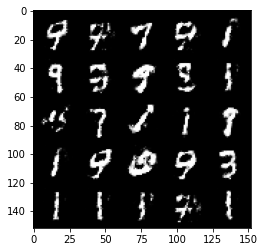

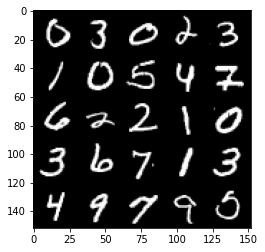

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 185, step 87000: Generator loss: 1.1643367595672607, discriminator loss: 0.5063641502857209


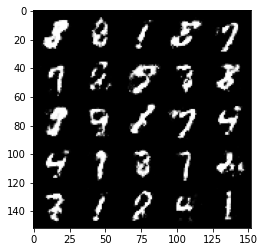

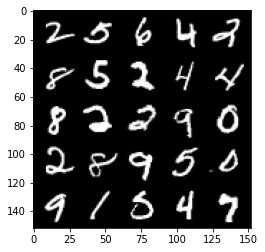

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 186, step 87500: Generator loss: 1.1778157944679255, discriminator loss: 0.4831736206412319


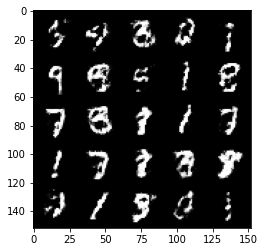

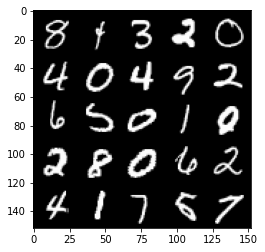

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 187, step 88000: Generator loss: 1.2100964856147751, discriminator loss: 0.477940219581127


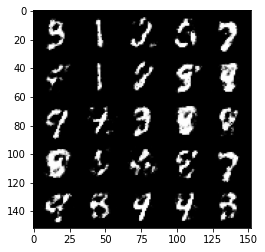

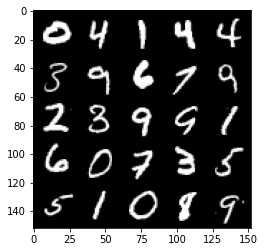

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 188, step 88500: Generator loss: 1.1215842685699458, discriminator loss: 0.49977841174602483


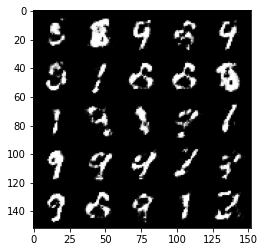

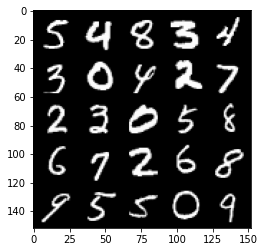

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 189, step 89000: Generator loss: 1.1814076583385469, discriminator loss: 0.491329140722752


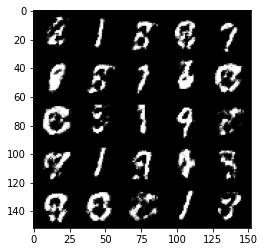

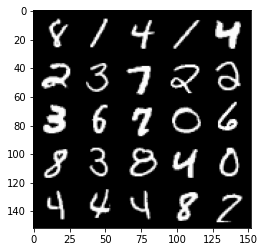

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 190, step 89500: Generator loss: 1.113999289155006, discriminator loss: 0.5107181141376493


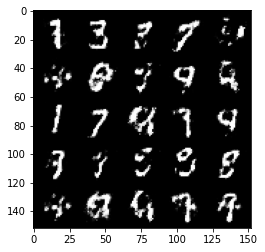

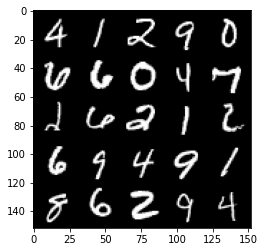

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 191, step 90000: Generator loss: 1.112865679383278, discriminator loss: 0.512297160387039


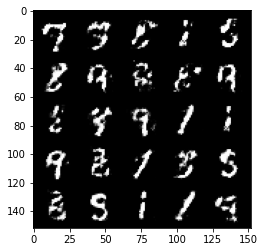

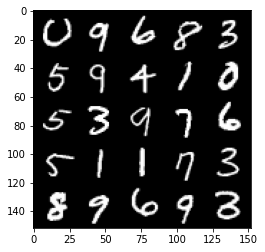

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 192, step 90500: Generator loss: 1.1360112583637236, discriminator loss: 0.5108564481139183


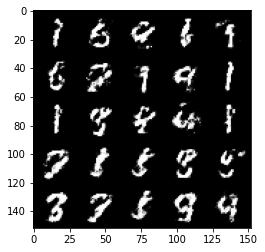

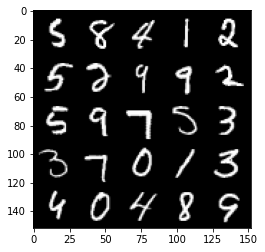

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 194, step 91000: Generator loss: 1.1386937651634201, discriminator loss: 0.5139754244089126


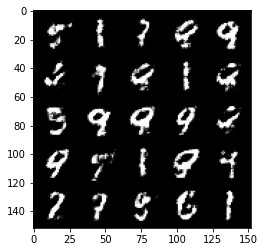

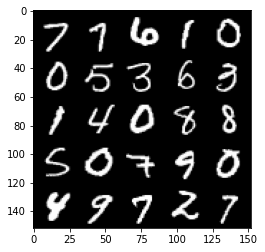

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 195, step 91500: Generator loss: 1.1278212987184533, discriminator loss: 0.5165701109766961


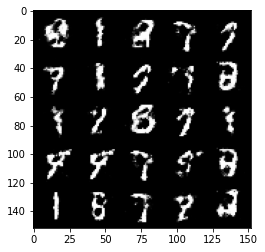

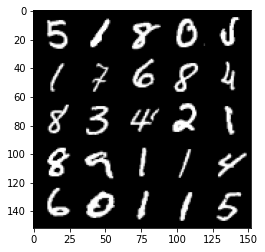

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 196, step 92000: Generator loss: 1.1019570683240896, discriminator loss: 0.5223152583837508


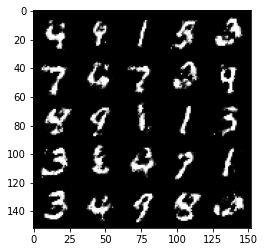

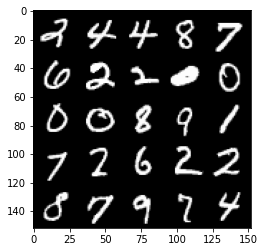

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 197, step 92500: Generator loss: 1.0997005985975268, discriminator loss: 0.5277169205546385


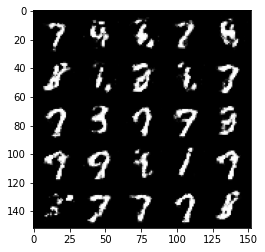

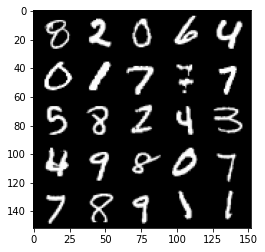

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 198, step 93000: Generator loss: 1.1136209828853607, discriminator loss: 0.5240295511484143


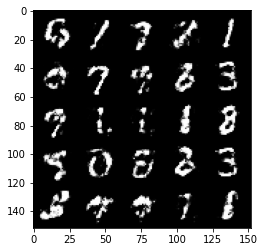

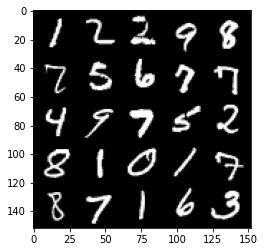

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 199, step 93500: Generator loss: 1.0666074078083052, discriminator loss: 0.5287874509096144


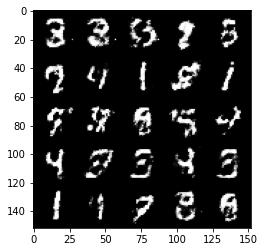

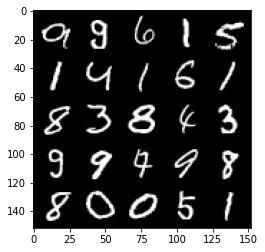

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # For testing purposes, to check that our code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
